# Stitching

In [ ]:
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np

#Plot single image
def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

#Plot multiple images
def plot_images(imgs, figsize_in_inches=(5,5)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

In [ ]:
 !pip install stitching

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Understand the function in the cell
from pathlib import Path
def get_image_paths(img_set):
    return [str(path.relative_to('.')) for path in Path('imgs').rglob(f'{img_set}*')]

mars_imgs = get_image_paths('m')

## Resize Images

In [ ]:

from stitching.image_handler import ImageHandler

img_handler = ImageHandler()
img_handler.set_img_names(mars_imgs)

medium_imgs = list(img_handler.resize_to_low_resolution())
low_imgs = list(img_handler.resize_to_low_resolution(medium_imgs))
final_imgs = list(img_handler.resize_to_final_resolution())

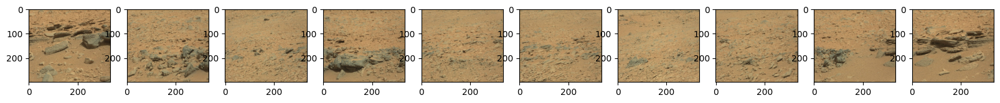

In [ ]:
plot_images(low_imgs, (20,20))

In [ ]:
original_size = img_handler.img_sizes[0]
medium_size = img_handler.get_image_size(medium_imgs[0])
low_size = img_handler.get_image_size(low_imgs[0])
final_size = img_handler.get_image_size(final_imgs[0])

print(f"Original Size: {original_size}  -> {'{:,}'.format(np.prod(original_size))} px ~ 1 MP")
print(f"Medium Size:   {medium_size}  -> {'{:,}'.format(np.prod(medium_size))} px ~ 0.6 MP")
print(f"Low Size:      {low_size}   -> {'{:,}'.format(np.prod(low_size))} px ~ 0.1 MP")
print(f"Final Size:    {final_size}  -> {'{:,}'.format(np.prod(final_size))} px ~ 1 MP")

Original Size: (560, 500)  -> 280,000 px ~ 1 MP
Medium Size:   (335, 299)  -> 100,165 px ~ 0.6 MP
Low Size:      (335, 299)   -> 100,165 px ~ 0.1 MP
Final Size:    (560, 500)  -> 280,000 px ~ 1 MP


##Feature Detection

In [ ]:
from stitching.feature_detector import FeatureDetector

finder = FeatureDetector("sift")
features = [finder.detect_features(img) for img in medium_imgs]
keypoints_center_img = finder.draw_keypoints(medium_imgs[1], features[1])

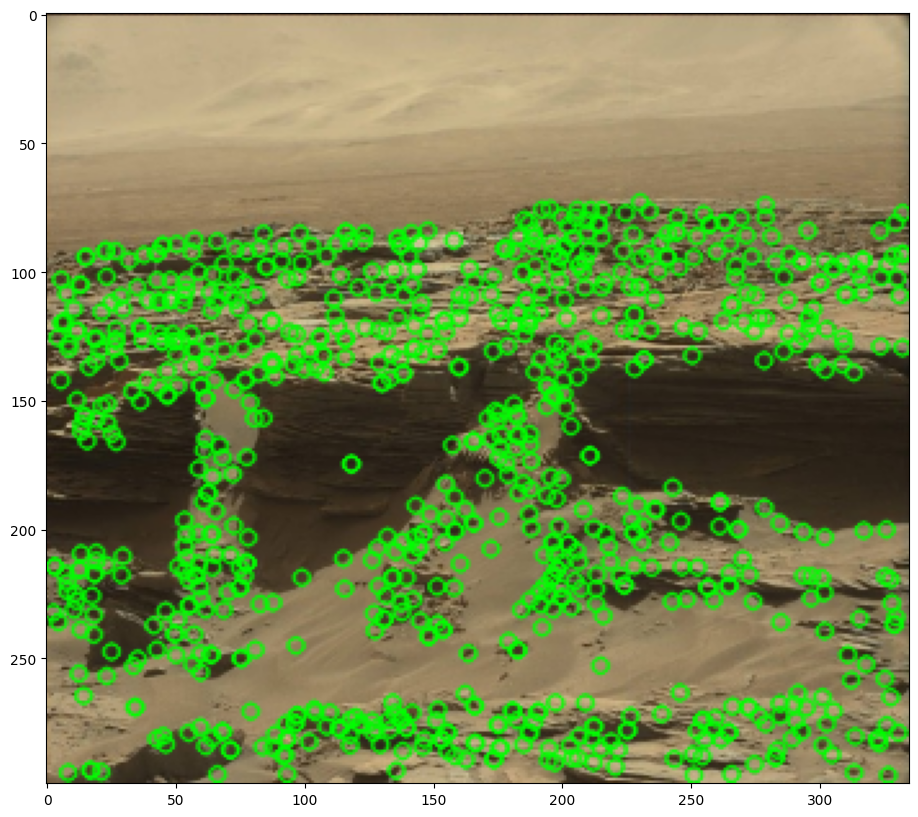

In [ ]:
plot_image(keypoints_center_img, (15,10))

In [ ]:
from stitching.feature_matcher import FeatureMatcher

matcher = FeatureMatcher()
matches = matcher.match_features(features)

In [ ]:
matcher.get_confidence_matrix(matches)

array([[0.        , 2.35294118, 0.38461538],
       [2.35294118, 0.        , 2.01612903],
       [0.38461538, 2.01612903, 0.        ]])

Matches Image 1 to Image 3


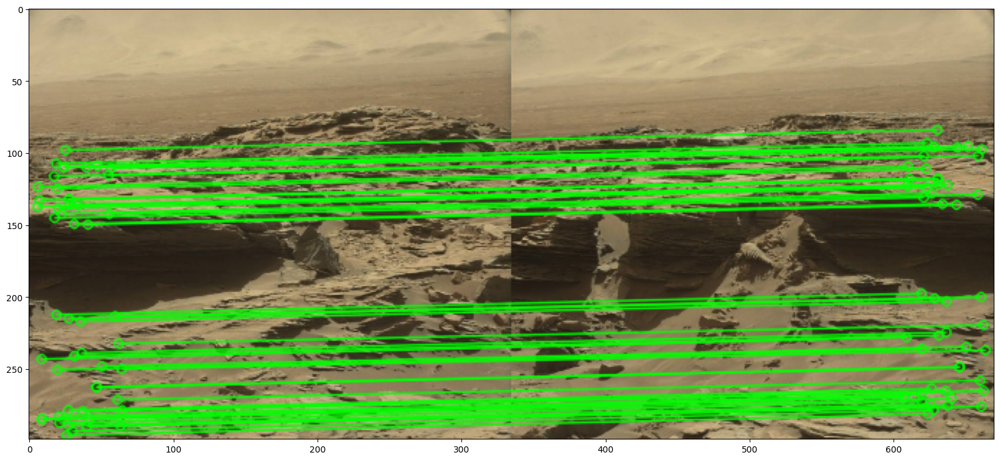

Matches Image 2 to Image 3


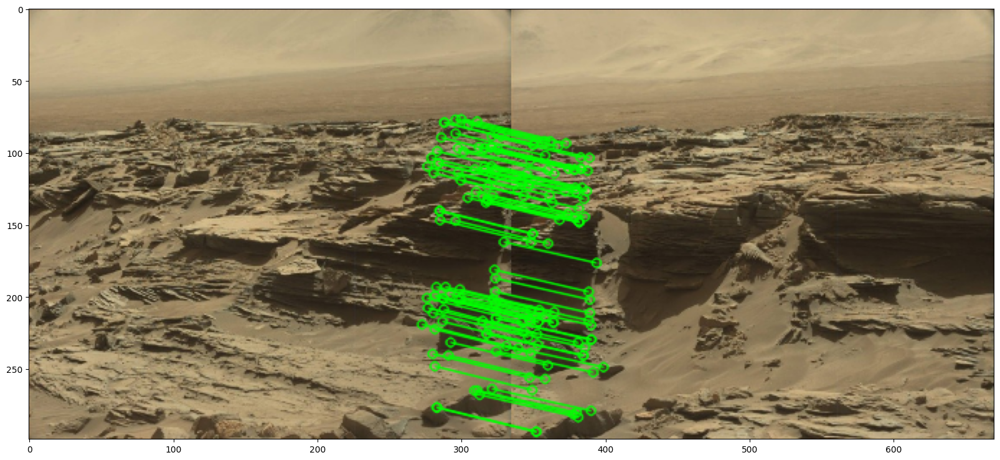

In [ ]:
all_relevant_matches = matcher.draw_matches_matrix(medium_imgs, features, matches, conf_thresh=2,
                                                   inliers=True, matchColor=(0, 255, 0))

for idx1, idx2, img in all_relevant_matches:
    print(f"Matches Image {idx1+1} to Image {idx2+1}")
    plot_image(img, (20,10))

## Subset`

In [ ]:
from stitching.subsetter import Subsetter

subsetter = Subsetter()
dot_notation = subsetter.get_matches_graph(img_handler.img_names, matches)
print(dot_notation)

NameError: ignored

In [ ]:
indices = subsetter.get_indices_to_keep(features, matches)

medium_imgs = subsetter.subset_list(medium_imgs, indices)
low_imgs = subsetter.subset_list(low_imgs, indices)
final_imgs = subsetter.subset_list(final_imgs, indices)
features = subsetter.subset_list(features, indices)
matches = subsetter.subset_matches(matches, indices)

img_names = subsetter.subset_list(img_handler.img_names, indices)
img_sizes = subsetter.subset_list(img_handler.img_sizes, indices)

img_handler.img_names, img_handler.img_sizes = img_names, img_sizes

print(img_handler.img_names)
print(matcher.get_confidence_matrix(matches))

['imgs/m3.jpg', 'imgs/m1.jpg', 'imgs/m2.jpg']
[[0.         0.40816327 2.0661157 ]
 [0.40816327 0.         2.35616438]
 [2.0661157  2.35616438 0.        ]]


## Camera Estimation, Adjustion and Correction

In [ ]:
from stitching.camera_estimator import CameraEstimator
from stitching.camera_adjuster import CameraAdjuster
from stitching.camera_wave_corrector import WaveCorrector

camera_estimator = CameraEstimator()
camera_adjuster = CameraAdjuster()
wave_corrector = WaveCorrector()

cameras = camera_estimator.estimate(features, matches)
cameras = camera_adjuster.adjust(features, matches, cameras)
cameras = wave_corrector.correct(cameras)

## Warp Images

In [ ]:
from stitching.warper import Warper

warper = Warper()

In [ ]:
warper.set_scale(cameras)

In [ ]:
low_sizes = img_handler.get_low_img_sizes()
camera_aspect = img_handler.get_medium_to_low_ratio()      # since cameras were obtained on medium imgs

warped_low_imgs = list(warper.warp_images(low_imgs, cameras, camera_aspect))
warped_low_masks = list(warper.create_and_warp_masks(low_sizes, cameras, camera_aspect))
low_corners, low_sizes = warper.warp_rois(low_sizes, cameras, camera_aspect)

In [ ]:
final_sizes = img_handler.get_final_img_sizes()
camera_aspect = img_handler.get_medium_to_final_ratio()    # since cameras were obtained on medium imgs

warped_final_imgs = list(warper.warp_images(final_imgs, cameras, camera_aspect))
warped_final_masks = list(warper.create_and_warp_masks(final_sizes, cameras, camera_aspect))
final_corners, final_sizes = warper.warp_rois(final_sizes, cameras, camera_aspect)

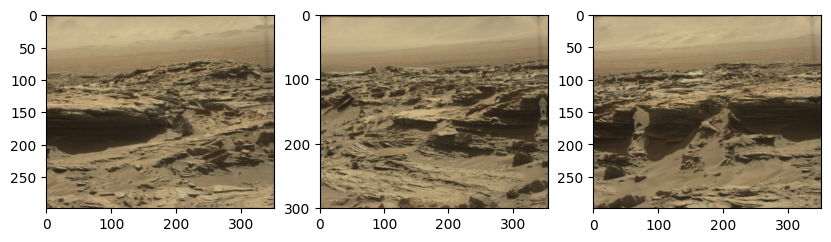

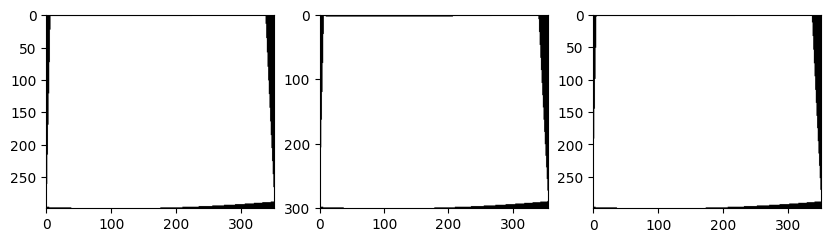

In [ ]:
plot_images(warped_low_imgs, (10,10))
plot_images(warped_low_masks, (10,10))

In [ ]:
print(final_corners)
print(final_sizes)

[(96, 2948), (-456, 2976), (-177, 2961)]
[(587, 499), (595, 503), (590, 501)]


## Excursion: Timelapser

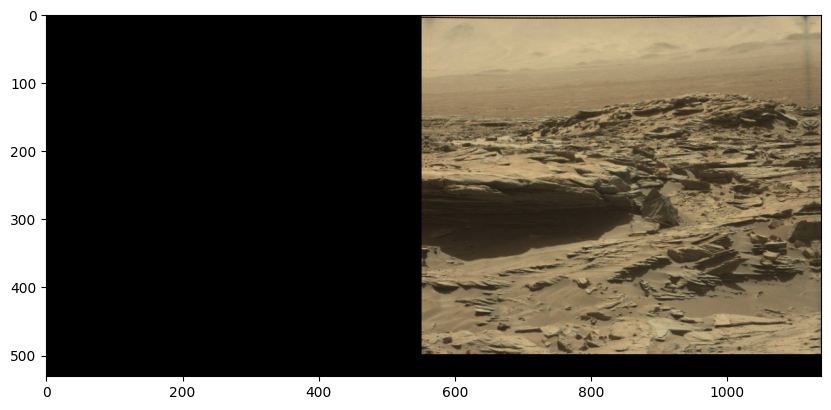

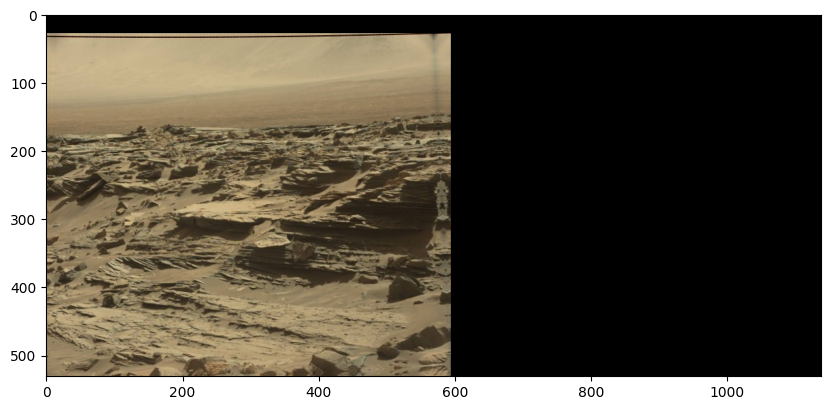

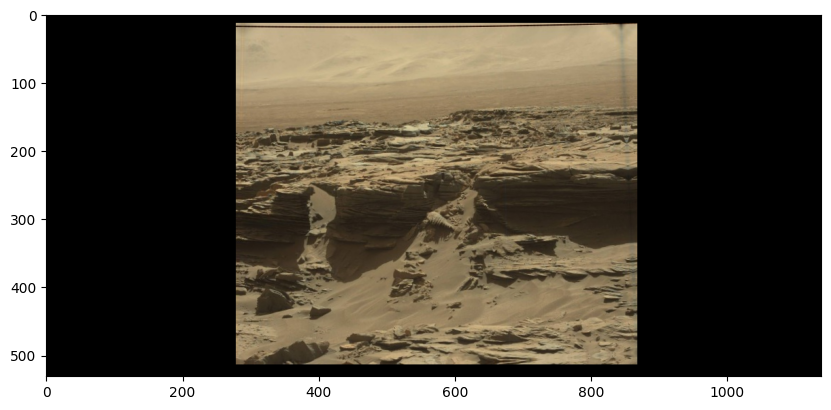

In [ ]:
from stitching.timelapser import Timelapser

timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(warped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

## Crop

In [ ]:
from stitching.cropper import Cropper

cropper = Cropper()

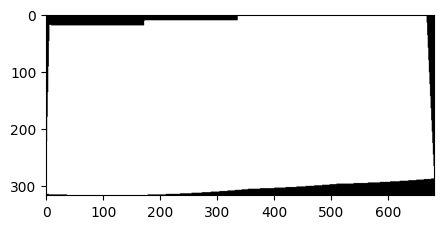

In [ ]:
mask = cropper.estimate_panorama_mask(warped_low_imgs, warped_low_masks, low_corners, low_sizes)
plot_image(mask, (5,5))

In [ ]:
#lir = cropper.estimate_largest_interior_rectangle(mask)

In [ ]:
lir = cropper.estimate_largest_interior_rectangle(mask)
print(lir)

Rectangle(x=6, y=20, width=662, height=269)


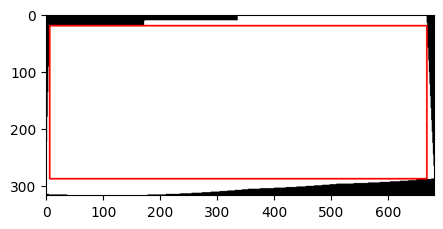

In [ ]:
plot = lir.draw_on(mask, size=2)
plot_image(plot, (5,5))

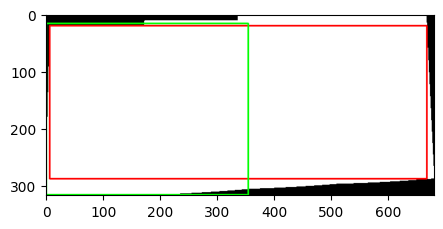

In [ ]:
low_corners = cropper.get_zero_center_corners(low_corners)
rectangles = cropper.get_rectangles(low_corners, low_sizes)

plot = rectangles[1].draw_on(plot, (0, 255, 0), 2)  # The rectangle of the center img
plot_image(plot, (5,5))

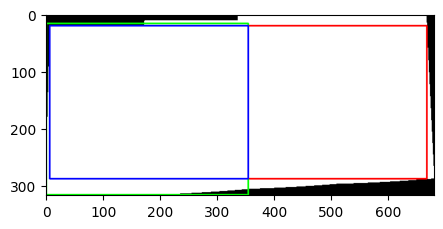

In [ ]:
overlap = cropper.get_overlap(rectangles[1], lir)
plot = overlap.draw_on(plot, (255, 0, 0), 2)
plot_image(plot, (5,5))

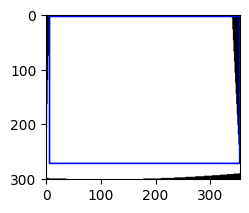

In [ ]:
intersection = cropper.get_intersection(rectangles[1], overlap)
plot = intersection.draw_on(warped_low_masks[1], (255, 0, 0), 2)
plot_image(plot, (2.5,2.5))

In [ ]:
cropper.prepare(warped_low_imgs, warped_low_masks, low_corners, low_sizes)

cropped_low_masks = list(cropper.crop_images(warped_low_masks))
cropped_low_imgs = list(cropper.crop_images(warped_low_imgs))
low_corners, low_sizes = cropper.crop_rois(low_corners, low_sizes)

lir_aspect = img_handler.get_low_to_final_ratio()  # since lir was obtained on low imgs
cropped_final_masks = list(cropper.crop_images(warped_final_masks, lir_aspect))
cropped_final_imgs = list(cropper.crop_images(warped_final_imgs, lir_aspect))
final_corners, final_sizes = cropper.crop_rois(final_corners, final_sizes, lir_aspect)

In [ ]:
timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(cropped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

## Seam Masks

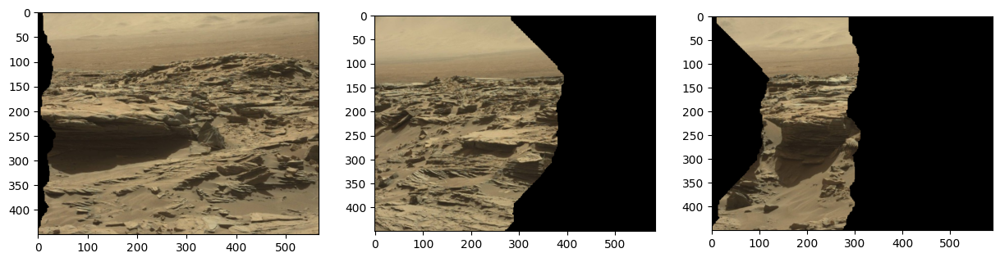

In [ ]:
from stitching.seam_finder import SeamFinder

seam_finder = SeamFinder()

seam_masks = seam_finder.find(cropped_low_imgs, low_corners, cropped_low_masks)
seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, cropped_final_masks)]

seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(cropped_final_imgs, seam_masks)]
plot_images(seam_masks_plots, (15,10))

## Exposure Error Compensation


In [ ]:
from stitching.exposure_error_compensator import ExposureErrorCompensator

compensator = ExposureErrorCompensator()

compensator.feed(low_corners, cropped_low_imgs, cropped_low_masks)

compensated_imgs = [compensator.apply(idx, corner, img, mask)
                    for idx, (img, mask, corner)
                    in enumerate(zip(cropped_final_imgs, cropped_final_masks, final_corners))]

## Blending

In [ ]:
from stitching.blender import Blender

blender = Blender()
blender.prepare(final_corners, final_sizes)
for img, mask, corner in zip(compensated_imgs, seam_masks, final_corners):
    blender.feed(img, mask, corner)
panorama, _ = blender.blend()

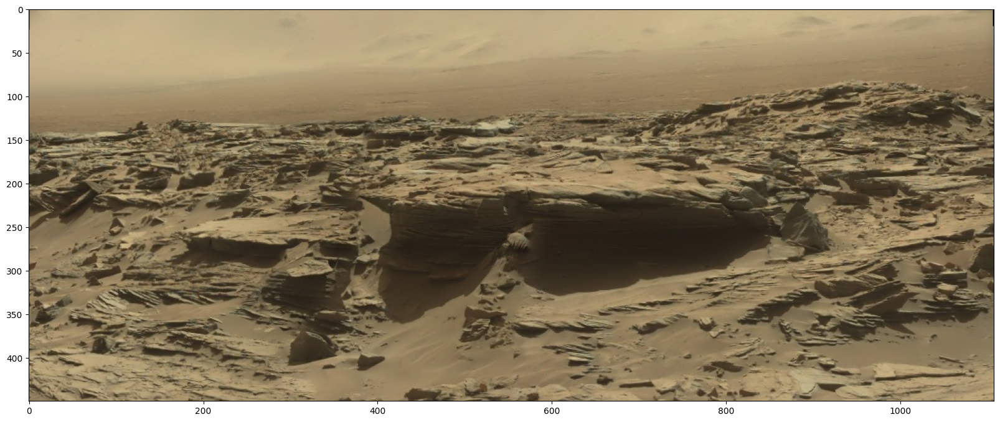

In [ ]:
plot_image(panorama, (20,20))

In [ ]:
# cv.imwrite('panorama.jpg', panorama)

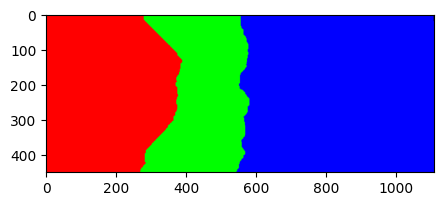

In [ ]:
blended_seam_masks = seam_finder.blend_seam_masks(seam_masks, final_corners, final_sizes)
plot_image(blended_seam_masks, (5,5))

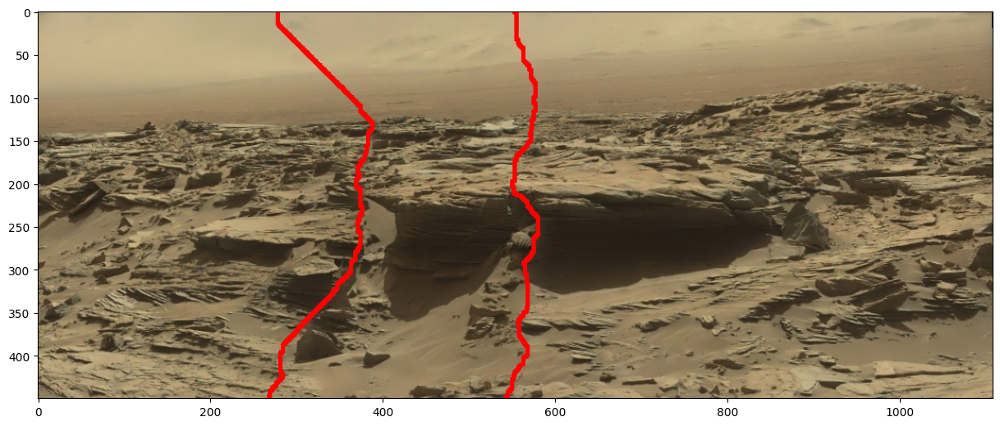

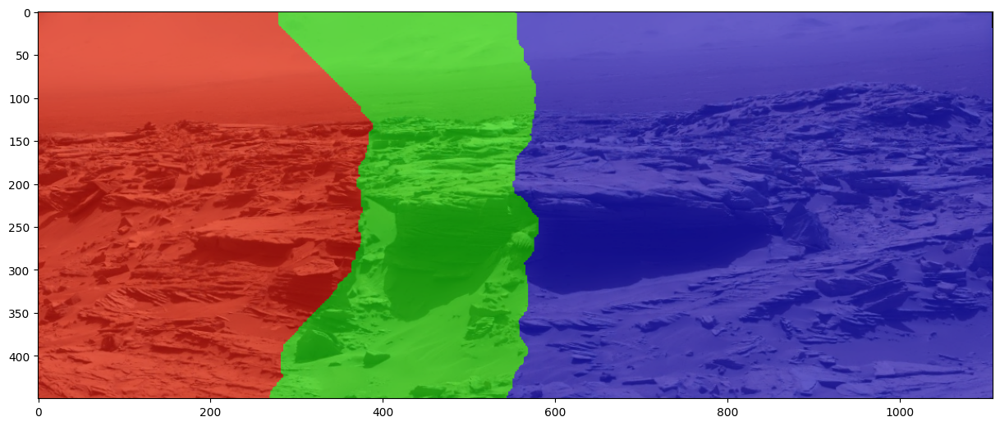

In [ ]:
plot_image(seam_finder.draw_seam_lines(panorama, blended_seam_masks, linesize=3), (15,10))
plot_image(seam_finder.draw_seam_polygons(panorama, blended_seam_masks), (15,10))

# Stitcher

In [ ]:
from stitching import Stitcher

settings = {"detector": "sift", "confidence_threshold": 0.5}
stitcher = Stitcher(**settings)
panorama = stitcher.stitch(mars_imgs)

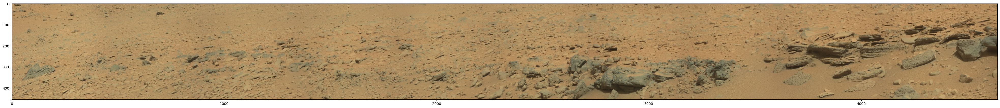

In [ ]:
plot_image(panorama, (50,20))

In [ ]:
cv.imwrite('mars23.jpg', panorama)

True